## Download Dataset

In [0]:
%%bash
cd /content/
git clone https://github.com/shuheng-cao/Paper-Implementation-and-Deployment.git
mkdir data
wget http://images.cocodataset.org/zips/val2017.zip -P ./data/
unzip ./data/val2017.zip -d ./data/ 
rm ./data/val2017.zip

Archive:  ./data/val2017.zip
   creating: ./data/val2017/
 extracting: ./data/val2017/000000212226.jpg  
 extracting: ./data/val2017/000000231527.jpg  
 extracting: ./data/val2017/000000578922.jpg  
 extracting: ./data/val2017/000000062808.jpg  
 extracting: ./data/val2017/000000119038.jpg  
 extracting: ./data/val2017/000000114871.jpg  
 extracting: ./data/val2017/000000463918.jpg  
 extracting: ./data/val2017/000000365745.jpg  
 extracting: ./data/val2017/000000320425.jpg  
 extracting: ./data/val2017/000000481404.jpg  
 extracting: ./data/val2017/000000314294.jpg  
 extracting: ./data/val2017/000000335328.jpg  
 extracting: ./data/val2017/000000513688.jpg  
 extracting: ./data/val2017/000000158548.jpg  
 extracting: ./data/val2017/000000132116.jpg  
 extracting: ./data/val2017/000000415238.jpg  
 extracting: ./data/val2017/000000321333.jpg  
 extracting: ./data/val2017/000000081738.jpg  
 extracting: ./data/val2017/000000577584.jpg  
 extracting: ./data/val2017/000000346905.jpg  
 e

Cloning into 'Paper-Implementation-and-Deployment'...
Checking out files: 100% (168/168), done.
--2020-06-12 00:42:56--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.40.140
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.40.140|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘./data/val2017.zip’

     0K .......... .......... .......... .......... ..........  0% 1.91M 6m47s
    50K .......... .......... .......... .......... ..........  0% 3.78M 5m6s
   100K .......... .......... .......... .......... ..........  0%  261M 3m25s
   150K .......... .......... .......... .......... ..........  0% 3.82M 3m25s
   200K .......... .......... .......... .......... ..........  0%  311M 2m44s
   250K .......... .......... .......... .......... ..........  0%  323M 2m17s
   300K .......... .......... .......... .......... ..........  0% 

## Pytorch Version

### Hyper Parameters

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import torch
import os
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
MODEL_PATH = "/content/drive/My Drive/models"
DATASET_PATH = "/content/data/"
DATASET_NAME = "val2017"
STYLE_PATH = "/content/Paper-Implementation-and-Deployment/Style Transfer/style images/"
STYLE_NAME = "sketch"
EPOCHS = 10
BATCH_SIZE = 8
IMAGE_SIZE = 512
CONTENT_WEIGHT = 1e5
STYLE_WEIGHT = 5e10
LEARNING_RATE = 1e-3

### Models

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#### Transformer

In [0]:
from torch import nn
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel=3, stride=2, debug=False):
        super(EncoderBlock, self).__init__()
        self.debug = debug

        padding = kernel // 2
        self.block = nn.Sequential(
            nn.ReflectionPad2d(padding),
            nn.Conv2d(in_channels, out_channels, kernel, stride),
            nn.BatchNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.1)
        )

    def forward(self, x):
        x = self.block(x)
        if self.debug:
            print(x.shape)
        return x

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            EncoderBlock(channels, channels, kernel=3, stride=1),
            EncoderBlock(channels, channels, kernel=3, stride=1)
        )

    def forward(self, x):
        residual = x
        x = self.block(x)
        return x + residual

class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel=3, stride=1, scale_factor=None, size=None, non_linear=True, debug=False):
        super(DecoderBlock, self).__init__()
        assert(scale_factor==None or size==None)
        # only one of scale_factor and size are necessary
        # if we want to convert the model to CoreML model, we must give size 
        # instead of scale_factor because onnx converter doesn't support scale
        # NOTE: we can easily get the size of each layer by setting debug=True
        self.scale_factor = scale_factor
        self.size = size
        self.debug = debug

        padding = kernel // 2
        self.block = nn.Sequential(
            nn.ReflectionPad2d(padding),
            nn.Conv2d(in_channels, out_channels, kernel, stride),
        )
        if non_linear:
            self.block.add_module("norm", nn.BatchNorm2d(out_channels, affine=True))
            self.block.add_module("relu", nn.LeakyReLU(0.1))
    
    def forward(self, x):
        if self.scale_factor:
            x = nn.functional.interpolate(x, mode='nearest', scale_factor=self.scale_factor)
        elif self.size:
            x = nn.functional.interpolate(x, mode='nearest', size=self.size)
        x = self.block(x)
        if self.debug:
            print(x.shape)
        return x

class TransformerNet(nn.Module):
    def __init__(self, debug=False, use_size=False):
        super(TransformerNet, self).__init__()
        self.use_size = use_size # we must set this to True if we want to convert this to CoreML model

        self.encoder = nn.Sequential(
            EncoderBlock(in_channels=3, out_channels=32, kernel=5, debug=debug),    # BATCH_SIZE, 32, 256, 256
            EncoderBlock(in_channels=32, out_channels=64, debug=debug),             # BATCH_SIZE, 64, 128, 128
            EncoderBlock(in_channels=64, out_channels=128, debug=debug)             # BATCH_SIZE, 128, 64, 64
        )

        self.res = nn.Sequential(
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128)
        )

        if use_size:
            self.decoder = nn.Sequential(
                DecoderBlock(in_channels=128, out_channels=64, size=IMAGE_SIZE//4, debug=debug),                            # BATCH_SIZE, 64, 128, 128
                DecoderBlock(in_channels=64, out_channels=32, size=IMAGE_SIZE//2, debug=debug),                             # BATCH_SIZE, 32, 256, 256
                DecoderBlock(in_channels=32, out_channels=3, kernel=5, size=IMAGE_SIZE, non_linear=False, debug=debug)      # BATCH_SIZE, 3, 512, 512
            )
        else:
            self.decoder = nn.Sequential(
                DecoderBlock(in_channels=128, out_channels=64, scale_factor=2, debug=debug),                            # BATCH_SIZE, 64, 128, 128
                DecoderBlock(in_channels=64, out_channels=32, scale_factor=2, debug=debug),                             # BATCH_SIZE, 32, 256, 256
                DecoderBlock(in_channels=32, out_channels=3, kernel=5, scale_factor=2, non_linear=False, debug=debug)   # BATCH_SIZE, 3, 512, 512
            )

    def forward(self, x):
        y = self.encoder(x)
        y = self.res(y)
        x = self.decoder(y)
        return x

In [0]:
transformer = TransformerNet().to(device)
print(transformer)

TransformerNet(
  (encoder): Sequential(
    (0): EncoderBlock(
      (block): Sequential(
        (0): ReflectionPad2d((2, 2, 2, 2))
        (1): Conv2d(3, 32, kernel_size=(5, 5), stride=(2, 2))
        (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): LeakyReLU(negative_slope=0.1)
      )
    )
    (1): EncoderBlock(
      (block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
        (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): LeakyReLU(negative_slope=0.1)
      )
    )
    (2): EncoderBlock(
      (block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
        (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): LeakyReLU(negative_slope=0.1)
      )
    )
  )
  (res): Sequential(
    (0): Residu

#### VGG

In [0]:
from torchvision import models
from collections import namedtuple
class Vgg16(nn.Module):
    def __init__(self, requires_grad=False):
        super(Vgg16, self).__init__()
        vgg_pretrained_features = models.vgg16(pretrained=True).features
        self.slice1 = nn.Sequential()
        self.slice2 = nn.Sequential()
        self.slice3 = nn.Sequential()
        self.slice4 = nn.Sequential()
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out

In [0]:
vgg = Vgg16(requires_grad=False).to(device)
print(vgg)

Vgg16(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
  )
  (sli

### Data Preparation

In [0]:
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

In [0]:
# Utilities
def load_image(filename, size=None):
    img = Image.open(filename)
    if size is not None:
        img = img.resize((size, size), Image.ANTIALIAS)
    return img

def gram_matrix(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) / (ch * h * w)
    return gram

def normalize_batch(batch):
    # normalize using imagenet mean and std
    # NOTE: for our transformer, we won't use normalization
    mean = batch.new_tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = batch.new_tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    batch = batch.div_(255.0)
    return (batch - mean) / std

In [0]:
# load content images
# NOTE: the expected input of VNCoreMLModel model is 1 to 255
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.mul(255))
])
train_dataset = datasets.ImageFolder(DATASET_PATH, transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE)

In [0]:
# load style images
# NOTE: the expected input of vgg model is 0 to 1
style_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.mul(255))
])
style = load_image(STYLE_PATH+STYLE_NAME+".jpg")
style = style_transform(style)

In [0]:
# get style gram matrix
style = style.repeat(BATCH_SIZE, 1, 1, 1).to(device)
features_style = vgg(normalize_batch(style))
gram_style = [gram_matrix(y) for y in features_style]

### Training

In [0]:
from tqdm.autonotebook import tqdm
from torch.optim import Adam
optimizer = Adam(transformer.parameters(), LEARNING_RATE)
epochs = tqdm(range(EPOCHS), desc="EPOCH", total=EPOCHS)
for i in epochs:
    epochs.set_description(f"EPOCH {i+1}/{EPOCHS}")
    transformer.train()
    cnt, log_dict = 0, {'total':0, 's_total':0, 'c_total':0}
    progress = tqdm(enumerate(train_loader), desc="Total Loss: , Style Loss: , Content Loss: \n", total=len(train_loader), ncols='75%')
    for _, (x, _) in progress:
        optimizer.zero_grad()

        x = x.to(device)
        y = transformer(x)
        features_y = vgg(normalize_batch(y))
        features_x = vgg(normalize_batch(x))

        content_loss = CONTENT_WEIGHT * nn.MSELoss()(features_y.relu3_3, features_x.relu3_3)

        style_loss = 0.
        for ft_y, gm_s in zip(features_y, gram_style):
            gm_y = gram_matrix(ft_y)
            style_loss += nn.MSELoss()(gm_y, gm_s[:len(x), :, :])
        style_loss *= STYLE_WEIGHT

        total_loss = content_loss + style_loss
        total_loss.backward()
        optimizer.step()

        # update logs
        cnt, s_loss, c_loss = cnt+1, style_loss.item()/len(x), content_loss.item()/len(x)
        log_dict['s_total'], log_dict['c_total'], log_dict['total'] = log_dict['s_total']+s_loss, log_dict['c_total']+c_loss, log_dict['total']+s_loss+c_loss
        progress.set_description(f"Total Loss: {log_dict['total']/cnt:.2f} ({s_loss+c_loss:.2f}), Style Loss: {log_dict['s_total']/cnt:.2f} ({s_loss:.2f}), Content Loss: {log_dict['c_total']/cnt:.2f} ({c_loss:.2f})")

In [0]:
# Save Model
transformer.eval().cpu()
save_model_filename = f"{STYLE_NAME}_{int(STYLE_WEIGHT//1e9)}.pt"
save_model_path = os.path.join(MODEL_PATH, save_model_filename)
torch.save(transformer.state_dict(), save_model_path)

### Evaluation

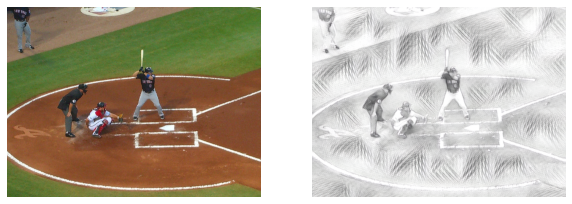

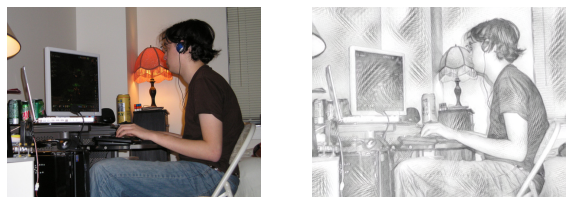

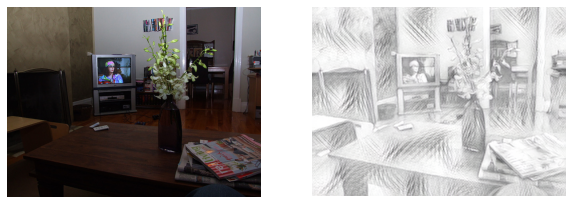

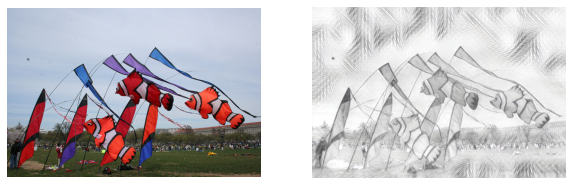

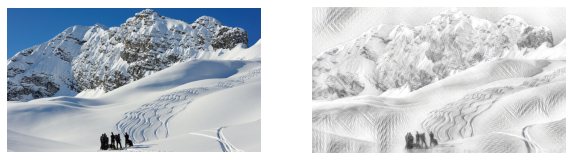

In [0]:
import random
# we will show 5 images
for _ in range(5):
    path = DATASET_PATH + DATASET_NAME
    img_path = os.path.join(path, random.choice(os.listdir(path)))
    img = load_image(img_path)
    if transformer.use_size:
        # if we fix the size of input, we must do the same transformation to eval images
        content_image = transform(img)
    else:
        # otherwise, we will use flexible image size for better visual results
        content_image = style_transform(img)
    content_image = content_image.unsqueeze(0).to(device)

    with torch.no_grad():
        transformer.to(device)
        output = transformer(content_image).cpu()

    plt.figure(figsize=(10,20))
    plt.subplot(1, 2, 1);plt.axis('off');plt.imshow(img)
    plt.subplot(1, 2, 2);plt.axis('off');plt.imshow(output[0].permute(1, 2, 0)/255)
    plt.show()

### "Cross" Training

Train the model for various combination of style images and style weights

In [0]:
STYLE_NAME = ["muse", "night", "scream", "sketch"]
STYLE_WEIGHT = [5e9, 7e9, 1e10, 2e10, 3e10, 4e10, 5e10, 7e10, 1e11, 2e11]

In [0]:
from tqdm.autonotebook import tqdm
from torch.optim import Adam
for style_name in STYLE_NAME:
    style = load_image(STYLE_PATH+style_name+".jpg")
    style = style_transform(style)
    style = style.repeat(BATCH_SIZE, 1, 1, 1).to(device)
    features_style = vgg(normalize_batch(style))
    gram_style = [gram_matrix(y) for y in features_style]

    for style_weight in STYLE_WEIGHT:
        save_model_filename = f"{style_name}_{int(style_weight//1e9)}.pt"
        save_model_path = os.path.join(MODEL_PATH, save_model_filename)
        if os.path.exists(save_model_path):
            print(f"Model for style {style_name} with style weight {int(style_weight//1e9)} already exists")
            continue
        transformer = TransformerNet().to(device)
        optimizer = Adam(transformer.parameters(), LEARNING_RATE)
        print(f"Training for style {style_name} with style weight {int(style_weight//1e9)}")
        
        epochs = tqdm(range(EPOCHS), desc="EPOCH", total=EPOCHS)
        for i in epochs:
            epochs.set_description(f"EPOCH {i+1}/{EPOCHS}")
            save_checkpoint_filename = f"{style_name}_{int(style_weight//1e9)}_{i+1}.pt"
            save_checkpoint_path = os.path.join(MODEL_PATH, save_checkpoint_filename)
            if os.path.exists(save_checkpoint_path):
                print(f"Model for style {style_name} with style weight {int(style_weight//1e9)} at epoch {i+1} already exists")
                transformer.load_state_dict(torch.load(save_checkpoint_path))
                continue
            transformer = transformer.to(device)
            transformer.train()
            cnt, log_dict = 0, {'total':0, 's_total':0, 'c_total':0}
            progress = tqdm(enumerate(train_loader), desc="Total Loss: , Style Loss: , Content Loss: \n", total=len(train_loader), ncols='75%')
            for _, (x, _) in progress:
                optimizer.zero_grad()

                x = x.to(device)
                y = transformer(x)
                features_y = vgg(normalize_batch(y))
                features_x = vgg(normalize_batch(x))

                content_loss = CONTENT_WEIGHT * nn.MSELoss()(features_y.relu3_3, features_x.relu3_3)

                style_loss = 0.
                for ft_y, gm_s in zip(features_y, gram_style):
                    gm_y = gram_matrix(ft_y)
                    style_loss += nn.MSELoss()(gm_y, gm_s[:len(x), :, :])
                style_loss *= style_weight

                total_loss = content_loss + style_loss
                total_loss.backward()
                optimizer.step()

                # update logs
                cnt, s_loss, c_loss = cnt+1, style_loss.item()/len(x), content_loss.item()/len(x)
                log_dict['s_total'], log_dict['c_total'], log_dict['total'] = log_dict['s_total']+s_loss, log_dict['c_total']+c_loss, log_dict['total']+s_loss+c_loss
                progress.set_description(f"Total Loss: {log_dict['total']/cnt:.2f} ({s_loss+c_loss:.2f}), Style Loss: {log_dict['s_total']/cnt:.2f} ({s_loss:.2f}), Content Loss: {log_dict['c_total']/cnt:.2f} ({c_loss:.2f})")
            transformer.eval().cpu()
            torch.save(transformer.state_dict(), save_checkpoint_path)
            print(f"Checkpoint saved at {save_checkpoint_path}")
        transformer.eval().cpu()
        torch.save(transformer.state_dict(), save_model_path)
        print(f"Model saved at {save_model_path}")

### "Cross" Validation

In order to run this section, you need to run everything before `Training` section.

Results for style muse with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


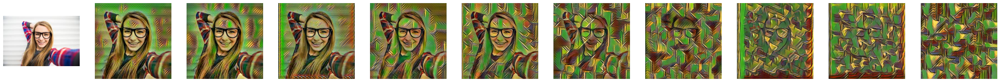

Results for style night with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


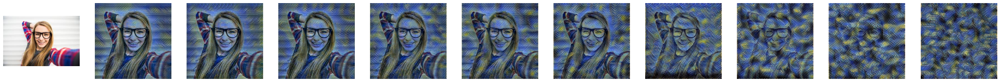

Results for style scream with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


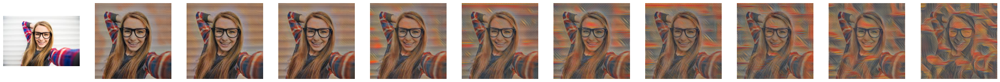

Results for style sketch with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


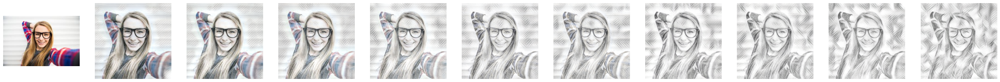

In [0]:
import random
TEST_STYLE_NAME = ["muse", "night", "scream", "sketch"]
TEST_STYLE_WEIGHT = [5e9, 7e9, 1e10, 2e10, 3e10, 4e10, 5e10, 7e10, 1e11, 2e11]
N = len(TEST_STYLE_WEIGHT)
# we will test on only one sample image
img_path = "/content/drive/My Drive/images/people.jpg"
img = load_image(img_path)
content_image = transform(img)
content_image = content_image.unsqueeze(0).to(device)

for style_name in TEST_STYLE_NAME:
    print(f"Results for style {style_name} with style weight {[int(i//1e9) for i in TEST_STYLE_WEIGHT]}:")
    plt.figure(figsize=(40,40*(N+1)))
    plt.subplot(1, N+1, 1);plt.axis('off');plt.imshow(img)
    for i, style_weight in enumerate(TEST_STYLE_WEIGHT):
        save_model_filename = f"{style_name}_{int(style_weight//1e9)}.pt"
        save_model_path = os.path.join(MODEL_PATH, save_model_filename)
        transformer = TransformerNet(use_size=True)
        transformer.load_state_dict(torch.load(save_model_path))
        with torch.no_grad():
            transformer.to(device)
            output = transformer(content_image).cpu()
        plt.subplot(1, N+1, i+2);plt.axis('off');plt.imshow(output[0].permute(1, 2, 0)/255)
    plt.show()

Results for style muse with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


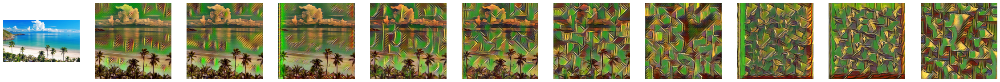

Results for style night with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


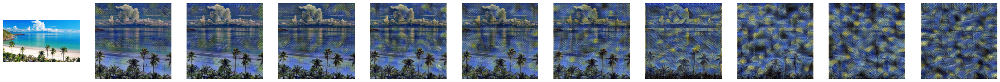

Results for style scream with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


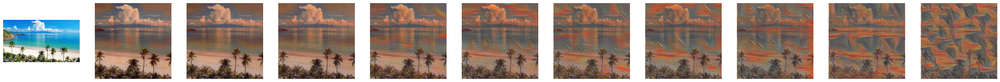

Results for style sketch with style weight [5, 7, 10, 20, 30, 40, 50, 70, 100, 200]:


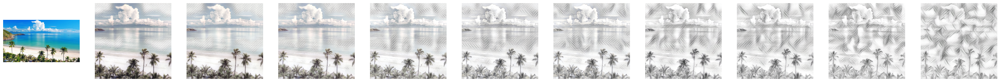

In [0]:
import random
TEST_STYLE_NAME = ["muse", "night", "scream", "sketch"]
TEST_STYLE_WEIGHT = [5e9, 7e9, 1e10, 2e10, 3e10, 4e10, 5e10, 7e10, 1e11, 2e11]
N = len(TEST_STYLE_WEIGHT)
# we will test on only one sample image
img_path = "/content/drive/My Drive/images/nature.jpg"
img = load_image(img_path)
content_image = transform(img)
content_image = content_image.unsqueeze(0).to(device)

for style_name in TEST_STYLE_NAME:
    print(f"Results for style {style_name} with style weight {[int(i//1e9) for i in TEST_STYLE_WEIGHT]}:")
    plt.figure(figsize=(40,40*(N+1)))
    plt.subplot(1, N+1, 1);plt.axis('off');plt.imshow(img)
    for i, style_weight in enumerate(TEST_STYLE_WEIGHT):
        save_model_filename = f"{style_name}_{int(style_weight//1e9)}.pt"
        save_model_path = os.path.join(MODEL_PATH, save_model_filename)
        transformer = TransformerNet(use_size=True)
        transformer.load_state_dict(torch.load(save_model_path))
        with torch.no_grad():
            transformer.to(device)
            output = transformer(content_image).cpu()
        plt.subplot(1, N+1, i+2);plt.axis('off');plt.imshow(output[0].permute(1, 2, 0)/255)
    plt.show()

### Conversion


In [0]:
# choose styles and style_weights to convert to CoreML Model
CONVERT_MODEL = {"muse":[2e10,3e10,4e10], "night":[2e10,4e10,5e10], "scream":[3e10,5e10,1e11], "sketch":[2e10,3e10,7e10]}

In [0]:
!pip install onnx_coreml
!pip install coremltools
!pip install onnxruntime
import onnx
from onnx import onnx_pb
import onnxruntime as nxrun
from onnx_coreml import convert
from torch.autograd import Variable

     |████████████████████████████████| 81kB 5.2MB/s 
     |████████████████████████████████| 3.4MB 14.8MB/s 
     |████████████████████████████████| 7.4MB 46.9MB/s 
ERROR: turicreate 5.4 requires mxnet<1.2.0,>=1.1.0, which is not installed.
ERROR: turicreate 5.4 has requirement coremltools==2.1.0, but you'll have coremltools 3.4 which is incompatible.
  Found existing installation: coremltools 2.1.0
    Uninstalling coremltools-2.1.0:
      Successfully uninstalled coremltools-2.1.0
     |████████████████████████████████| 3.9MB 8.5MB/s 


#### Pytorch Model to ONNX Model

In [0]:
class Unsqueeze(nn.Module):
    def __init__(self): 
        super().__init__()
    def forward(self, x): 
        return x.unsqueeze(0)

class Squeeze(nn.Module):
    def __init__(self): 
        super().__init__()
    def forward(self, x): 
        return x.squeeze(0)

In [0]:
dummy_input = Variable(torch.randn(3, IMAGE_SIZE, IMAGE_SIZE))
for style_name in CONVERT_MODEL:
    for style_weight in CONVERT_MODEL[style_name]:
        save_model_filename = f"{style_name}_{int(style_weight//1e9)}.pt"
        save_model_path = os.path.join(MODEL_PATH, save_model_filename)
        onnx_model_filename = f"{style_name}_{int(style_weight//1e9)}.onnx"
        onnx_model_path = os.path.join(MODEL_PATH, onnx_model_filename)

        transformer = TransformerNet(use_size=True)
        transformer.load_state_dict(torch.load(save_model_path))
        final_model = nn.Sequential(
            Unsqueeze(),
            transformer,
            Squeeze()
        )
        torch.onnx.export(final_model, dummy_input, onnx_model_path, input_names=["inputImage"], output_names=["outputImage"])
        print(f"Successfully export model at {onnx_model_path}")

/usr/local/lib/python3.6/dist-packages/torch/onnx/symbolic_helper.py:243: UserWarning: You are trying to export the model with onnx:Upsample for ONNX opset version 9. This operator might cause results to not match the expected results by PyTorch.
ONNX's Upsample/Resize operator did not match Pytorch's Interpolation until opset 11. Attributes to determine how to transform the input were added in onnx:Resize in opset 11 to support Pytorch's behavior (like coordinate_transformation_mode and nearest_mode).
We recommend using opset 11 and above for models using this operator. 
  "" + str(_export_onnx_opset_version) + ". "


Successfully export model at /content/drive/My Drive/models/muse_20.onnx
Successfully export model at /content/drive/My Drive/models/muse_30.onnx
Successfully export model at /content/drive/My Drive/models/muse_40.onnx
Successfully export model at /content/drive/My Drive/models/night_20.onnx
Successfully export model at /content/drive/My Drive/models/night_40.onnx
Successfully export model at /content/drive/My Drive/models/night_50.onnx
Successfully export model at /content/drive/My Drive/models/scream_30.onnx
Successfully export model at /content/drive/My Drive/models/scream_50.onnx
Successfully export model at /content/drive/My Drive/models/scream_100.onnx
Successfully export model at /content/drive/My Drive/models/sketch_20.onnx
Successfully export model at /content/drive/My Drive/models/sketch_30.onnx
Successfully export model at /content/drive/My Drive/models/sketch_70.onnx


#### Test ONNX Model

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


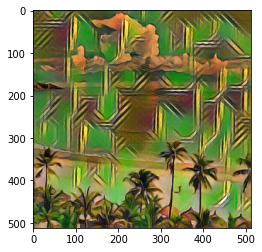

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


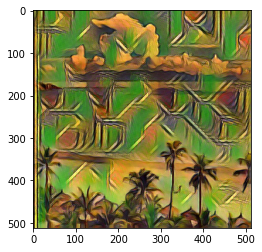

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


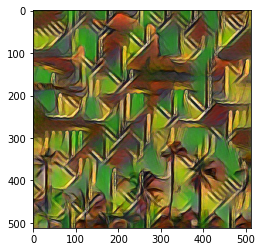

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


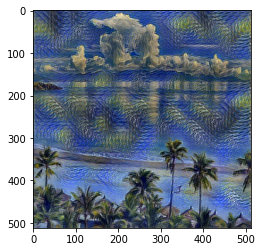

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


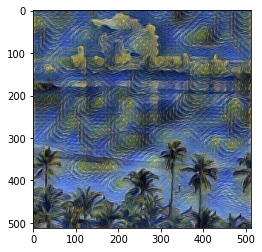

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


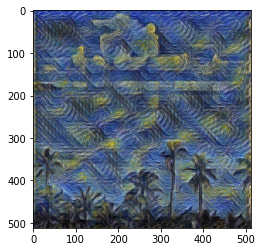

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


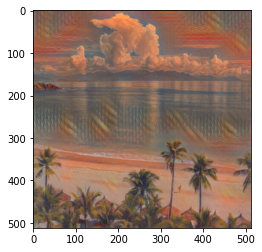

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


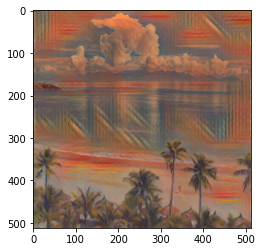

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


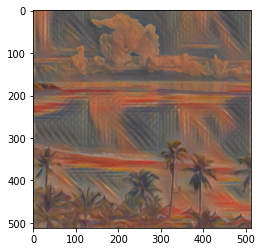

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


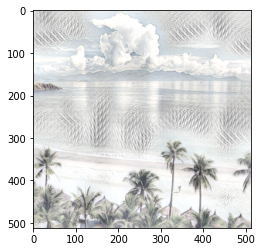

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


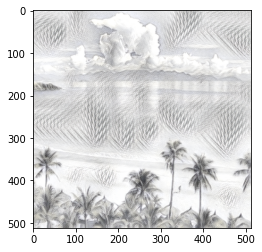

The model expects input shape:  [3, 512, 512]
The model expects output shape:  [3, 512, 512]


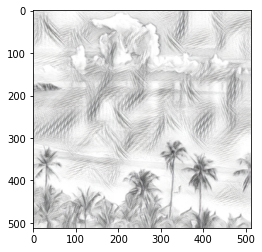

In [0]:
img_path = "/content/drive/My Drive/images/nature.jpg"
img = load_image(img_path)
for style_name in CONVERT_MODEL:
    for style_weight in CONVERT_MODEL[style_name]:
        onnx_model_filename = f"{style_name}_{int(style_weight//1e9)}.onnx"
        onnx_model_path = os.path.join(MODEL_PATH, onnx_model_filename)
        sess = nxrun.InferenceSession(onnx_model_path)
        print("The model expects input shape: ", sess.get_inputs()[0].shape)
        print("The model expects output shape: ", sess.get_outputs()[0].shape)
        input_name = sess.get_inputs()[0].name
        result = sess.run(None, {input_name: transform(img).data.cpu().numpy()})
        plt.imshow(result[0].transpose(1, 2, 0)/255);plt.show()

#### ONNX Model to CoreML Model

In [0]:
for style_name in CONVERT_MODEL:
    for style_weight in CONVERT_MODEL[style_name]:
        onnx_model_filename = f"{style_name}_{int(style_weight//1e9)}.onnx"
        coreml_model_filename = f"{style_name}_{int(style_weight//1e9)}.mlmodel"
        onnx_model_path = os.path.join(MODEL_PATH, onnx_model_filename)
        coreml_model_path = os.path.join(MODEL_PATH, coreml_model_filename)
        model_file = open(onnx_model_path, 'rb')
        model_proto = onnx_pb.ModelProto()
        model_proto.ParseFromString(model_file.read())
        coreml_model = convert(model_proto, image_input_names=['inputImage'], image_output_names=['outputImage'])
        coreml_model.save(coreml_model_path)
        # Comment this out if you want to keep onnx model
        os.remove(onnx_model_path)

1/72: Converting Node Type Unsqueeze
2/72: Converting Node Type Pad
3/72: Converting Node Type Conv
4/72: Converting Node Type BatchNormalization
5/72: Converting Node Type LeakyRelu
6/72: Converting Node Type Pad
7/72: Converting Node Type Conv
8/72: Converting Node Type BatchNormalization
9/72: Converting Node Type LeakyRelu
10/72: Converting Node Type Pad
11/72: Converting Node Type Conv
12/72: Converting Node Type BatchNormalization
13/72: Converting Node Type LeakyRelu
14/72: Converting Node Type Pad
15/72: Converting Node Type Conv
16/72: Converting Node Type BatchNormalization
17/72: Converting Node Type LeakyRelu
18/72: Converting Node Type Pad
19/72: Converting Node Type Conv
20/72: Converting Node Type BatchNormalization
21/72: Converting Node Type LeakyRelu
22/72: Converting Node Type Add
23/72: Converting Node Type Pad
24/72: Converting Node Type Conv
25/72: Converting Node Type BatchNormalization
26/72: Converting Node Type LeakyRelu
27/72: Converting Node Type Pad
28/72: 

## Turi Create Model

### Setup GPU

In [0]:
# Install libraries - you might need to restart the runtime after doing this
!pip install turicreate==5.4
# The wrong version of mxnet will be installed
!pip uninstall -y mxnet
# Install CUDA10-compatible version of mxnet
!pip install mxnet-cu100

     |████████████████████████████████| 87.4MB 51kB/s 
     |████████████████████████████████| 2.7MB 52.8MB/s 
     |████████████████████████████████| 23.8MB 1.2MB/s 
     |████████████████████████████████| 327kB 55.1MB/s 
  Created wheel for resampy: filename=resampy-0.2.1-cp36-none-any.whl size=320850 sha256=a151fea17f0734b481691d43b955391b2ed9588bfe9717ab74f223b49fed28c1
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
Successfully built resampy
ERROR: mxnet 1.1.0.post0 has requirement numpy<1.15.0,>=1.8.2, but you'll have numpy 1.18.5 which is incompatible.
ERROR: mxnet 1.1.0.post0 has requirement requests<2.19.0,>=2.18.4, but you'll have requests 2.23.0 which is incompatible.
  Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1
  Found existing installation: resampy 0.2.2
    Uninstalling resampy-0.2.2:
      Successfully uninstalled resampy-0.2.2
Un

In [0]:
# import coremltools
import turicreate as tc
tc.config.set_num_gpus(-1)

         To fix this, please install the currently recommended version:

             pip uninstall -y mxnet && pip install mxnet==1.1.0

         If you want to use a CUDA GPU, then change 'mxnet' to 'mxnet-cu90' (adjust 'cu90' depending on your CUDA version):



### Model Training

In [0]:
MODEL_PATH = "/content/drive/My Drive/models/"
DATASET_PATH = "/content/data/"
DATASET_NAME = "val2017"
STYLE_PATH = "/content/Paper-Implementation-and-Deployment/Style Transfer/style images/"

In [0]:
# Load the style and content images
styles = tc.load_images(STYLE_PATH)
content = tc.load_images(DATASET_PATH+DATASET_NAME)

# Create a StyleTransfer model
model = tc.style_transfer.create(styles, content)

Read 4688 images in 5.00195 secs	speed: 937.234 file/sec

Using 'image' in style_dataset as feature column and using 'image' in content_dataset as feature column
Setting max_iterations to be 4000
Download completed: /var/tmp/model_cache/resnet-16.params


/usr/local/lib/python3.6/dist-packages/mxnet/gluon/block.py:428: UserWarning: load_params is deprecated. Please use load_parameters.
  warnings.warn("load_params is deprecated. Please use load_parameters.")


Download completed: /var/tmp/model_cache/vgg16-conv1_1-4_3.params
Using GPU to create model (Tesla P100-PCIE-16GB)
Analyzing visual features of the style images
+--------------+--------------+--------------+
| Iteration    | Loss         | Elapsed Time |
+--------------+--------------+--------------+
| 1            | 11.067       | 7.6          |
| 31           | 12.153       | 17.7         |
| 57           | 10.914       | 30.2         |
| 87           | 9.386        | 40.3         |
| 114          | 8.797        | 53.3         |
| 144          | 7.268        | 63.3         |
| 171          | 7.470        | 76.1         |
| 201          | 6.812        | 86.2         |
| 228          | 6.453        | 99.2         |
| 258          | 5.754        | 109.2        |
| 285          | 6.075        | 122.1        |
| 315          | 6.297        | 132.2        |
| 342          | 5.514        | 145.0        |
| 372          | 5.054        | 155.1        |
| 398          | 5.181        | 167.6   

### Model Saving

In [0]:
# Export for use in Core ML
model.export_coreml(MODEL_PATH+"turicreate.mlmodel", image_shape=(512,512))